In [53]:
import numpy as np
import matplotlib.pyplot as plt
steps = 300
positions = np.zeros((steps, 3, 2))
h = 0.3
G =  1
Mass1 = 10000
Mass2 = 10
Mass3 = 1
r1i = np.array([0,  0])
r2i = np.array( [100, 0])
r3i = np.array([102, 0])
v1i = np.array([0,  0])
v2i = np.array([0,  10])
v3i = np.array([0, 12.3452])
Ac1i = ((G*Mass2)*(r2i-r1i)/np.linalg.norm(r2i - r1i)**3)+((G*Mass3)*(r3i-r1i)/np.linalg.norm(r3i - r1i)**3)
Ac2i = ((G*Mass1)*(r1i-r2i)/np.linalg.norm(r1i - r2i)**3)+((G*Mass3)*(r3i-r2i)/np.linalg.norm(r3i - r2i)**3)
Ac3i = ((G*Mass1)*(r1i-r3i)/np.linalg.norm(r1i - r3i)**3)+((G*Mass2)*(r2i-r3i)/np.linalg.norm(r2i - r3i)**3)
i=0

for i in range(steps):
    r1n = r1i + v1i*h+0.5*Ac1i*h**2
    r2n = r2i + v2i*h+0.5*Ac2i*h**2
    r3n = r3i + v3i*h+0.5*Ac3i*h**2
    Ac1n = ((G*Mass2)*(r2n-r1n)/np.linalg.norm(r2n - r1n)**3)+((G*Mass3)*(r3n-r1n)/np.linalg.norm(r3n - r1n)**3)
    Ac2n = ((G*Mass1)*(r1n-r2n)/np.linalg.norm(r1n - r2n)**3)+((G*Mass3)*(r3n-r2n)/np.linalg.norm(r3n - r2n)**3)
    Ac3n = ((G*Mass1)*(r1n-r3n)/np.linalg.norm(r1n - r3n)**3)+((G*Mass2)*(r2n-r3n)/np.linalg.norm(r2n - r3n)**3)
    v1n = v1i + 0.5*h*(Ac1i +Ac1n)
    v2n = v2i + 0.5*h*(Ac2i +Ac2n)
    v3n = v3i + 0.5*h*(Ac3i +Ac3n)
    r1i = r1n
    r2i = r2n
    r3i = r3n
    v1i = v1n
    v2i = v2n
    v3i = v3n
    Ac1i = Ac1n
    Ac2i =Ac2n
    Ac3i =Ac3n
    positions[i, 0] = r1n
    positions[i, 1] = r2n
    positions[i, 2] = r3n 
    i= i+1



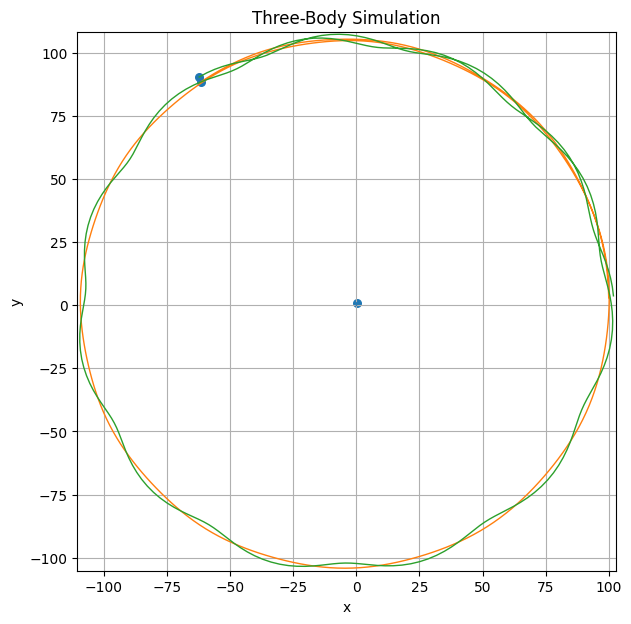

In [54]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

# Create figure
fig, ax = plt.subplots(figsize=(7, 7))

# Determine plot limits
margin = 1
xmin = np.min(positions[:, :, 0]) - margin
xmax = np.max(positions[:, :, 0]) + margin
ymin = np.min(positions[:, :, 1]) - margin
ymax = np.max(positions[:, :, 1]) + margin

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_aspect('equal')
ax.grid(True)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_title("Three-Body Simulation")

# Draw the particles
scatter = ax.scatter([], [], s=30)

# Draw the trajectories
trail1, = ax.plot([], [], lw=1)
trail2, = ax.plot([], [], lw=1)
trail3, = ax.plot([], [], lw=1)

def init():
    scatter.set_offsets(np.empty((0, 2)))
    trail1.set_data([], [])
    trail2.set_data([], [])
    trail3.set_data([], [])
    return scatter, trail1, trail2, trail3

def update(frame):

    # Particle positions
    scatter.set_offsets(positions[frame])

    # Trails
    trail1.set_data(positions[:frame+1, 0, 0],
                    positions[:frame+1, 0, 1])

    trail2.set_data(positions[:frame+1, 1, 0],
                    positions[:frame+1, 1, 1])

    trail3.set_data(positions[:frame+1, 2, 0],
                    positions[:frame+1, 2, 1])

    return scatter, trail1, trail2, trail3

ani = FuncAnimation(
    fig,
    update,
    frames=len(positions),
    init_func=init,
    interval=20,
    blit=True
)

HTML(ani.to_jshtml())